In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


# Building a simulator in 2D

In [26]:
# Perfect sensor
def sense(x):
    return x

### Euler integration

In [27]:
def simulate(Δt, x, u):
    x += Δt * u
    return x

### Control policy

In [32]:
def control(t, y):
    ### WRITE YOUR CONTROL POLICY HERE:
    x = cos(t)
    y = cos(2*t)
    ux = x*cos(pi/4)-y*sin(pi/4)
    uy = x*sin(pi/4)+y*cos(pi/4)

    return array([-ux, -uy])

### Running the simulator

In [33]:
tf = 2*pi
Δt = .01   # Time step
time = linspace(0.,tf, int(tf / Δt) + 1)  # Time interval


# Initial conditions
x = array([0., 0.])
x_log = [copy(x)]

for t in time:
    y = sense(x)
    u = control(t, y)    
    x = simulate(Δt, x, u)
    x_log.append(copy(x))
    
x_log = array(x_log)

(-1.0099079053091429,
 1.0099079053091433,
 -1.0169789731210082,
 1.0028368374972778)

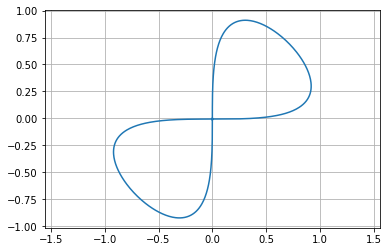

In [34]:
grid()
plt.xlim(-1,1)
plt.ylim(-1,1)
plt.plot(x_log[:,0], x_log[:,1])
plt.axis('equal')

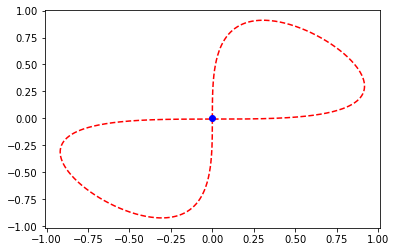

In [35]:
import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display    
from IPython.display import HTML
    


fig, ax = plt.subplots()

def animate(t):
    ax.clear()
    
    # Path
    plot(x_log[:,0], x_log[:,1], 'r--')
    
    # Initial conditions
    plot(x_log[t,0], x_log[t,1], 'bo')
    
    

anim = animation.FuncAnimation(fig, animate, frames=len(time), interval=60)

HTML(anim.to_jshtml())